## Customer Chrun: Data Cleaning and Basic EDA

In [2]:
# Importing important libraries

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import warnings

warnings.filterwarnings('ignore')

In C:\Users\adity\anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\adity\anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\adity\anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In C:\Users\adity\anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\adity\anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mpl

In [3]:
# Reading the dataset

df = pd.read_excel('Customer CHurn.xlsx')

In [3]:
# Head and Tail

df.head(5)

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,20000,1,4.0,3.0,6.0,Debit Card,Female,3.0,3.0,Super,2.0,Single,9.0,1.0,11.0,1.0,5.0,159.93,Mobile
1,20001,1,0.0,1.0,8.0,UPI,Male,3.0,4.0,Regular Plus,3.0,Single,7.0,1.0,15.0,0.0,0.0,120.90,Mobile
2,20002,1,0.0,1.0,30.0,Debit Card,Male,2.0,4.0,Regular Plus,3.0,Single,6.0,1.0,14.0,0.0,3.0,NaN,Mobile
3,20003,1,0.0,3.0,15.0,Debit Card,Male,2.0,4.0,Super,5.0,Single,8.0,0.0,23.0,0.0,3.0,134.07,Mobile
4,20004,1,0.0,1.0,12.0,Credit Card,Male,2.0,3.0,Regular Plus,5.0,Single,3.0,0.0,11.0,1.0,3.0,129.60,Mobile


In [4]:
df.tail(5)

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
11255,31255,0,10.0,1.0,34.0,Credit Card,Male,3.0,2.0,Super,1.0,Married,9.0,0.0,19.0,1.0,4.0,153.71,Computer
11256,31256,0,13.0,1.0,19.0,Credit Card,Male,3.0,5.0,HNI,5.0,Married,7.0,0.0,16.0,1.0,8.0,226.91,Mobile
11257,31257,0,1.0,1.0,14.0,Debit Card,Male,3.0,2.0,Super,4.0,Married,7.0,1.0,22.0,1.0,4.0,191.42,Mobile
11258,31258,0,23.0,3.0,11.0,Credit Card,Male,4.0,5.0,Super,4.0,Married,7.0,0.0,16.0,2.0,9.0,179.90,Computer
11259,31259,0,8.0,1.0,22.0,Credit Card,Male,3.0,2.0,Super,3.0,Married,5.0,0.0,13.0,2.0,3.0,175.04,Mobile


In [5]:
# Checking Shape of Data

print('Data Set contains',df.shape[0],'rows and',df.shape[1],'columns')

Data Set contains 11260 rows and 19 columns


In [6]:
# Basic Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   AccountID                11260 non-null  int64  
 1   Churn                    11260 non-null  int64  
 2   Tenure                   11042 non-null  float64
 3   City_Tier                11148 non-null  float64
 4   CC_Contacted_LY          11158 non-null  float64
 5   Payment                  11151 non-null  object 
 6   Gender                   11152 non-null  object 
 7   Service_Score            11162 non-null  float64
 8   Account_user_count       10816 non-null  float64
 9   account_segment          11163 non-null  object 
 10  CC_Agent_Score           11144 non-null  float64
 11  Marital_Status           11048 non-null  object 
 12  rev_per_month            10469 non-null  float64
 13  Complain_ly              10903 non-null  float64
 14  rev_growth_yoy        

In [7]:
pd.DataFrame({'NULL':df.isnull().sum(), 'Data Type':df.dtypes})

,NULL,Data Type
AccountID,0,int64
Churn,0,int64
Tenure,218,float64
City_Tier,112,float64
CC_Contacted_LY,102,float64
Payment,109,object
Gender,108,object
Service_Score,98,float64
Account_user_count,444,float64
account_segment,97,object


In [8]:
# Checking Duplicates

df.duplicated().sum()

0

In [9]:
# Summary of data

df.drop(['AccountID','Churn','City_Tier','Account_user_count'],axis = 1).describe().T

,count,mean,std,min,25%,50%,75%,max
Tenure,11042.0,11.025086,12.879782,0.0,2.00,9.00,16.00,99.0
CC_Contacted_LY,11158.0,17.867091,8.853269,4.0,11.00,16.00,23.00,132.0
Service_Score,11162.0,2.902526,0.725584,0.0,2.00,3.00,3.00,5.0
CC_Agent_Score,11144.0,3.066493,1.379772,1.0,2.00,3.00,4.00,5.0
rev_per_month,10469.0,6.362594,11.909686,1.0,3.00,5.00,7.00,140.0
Complain_ly,10903.0,0.285334,0.451594,0.0,0.00,0.00,1.00,1.0
rev_growth_yoy,11257.0,16.193391,3.757721,4.0,13.00,15.00,19.00,28.0
coupon_used_for_payment,11257.0,1.790619,1.969551,0.0,1.00,1.00,2.00,16.0
Day_Since_CC_connect,10902.0,4.633187,3.697637,0.0,2.00,3.00,8.00,47.0
cashback,10787.0,196.236370,178.660514,0.0,147.21,165.25,200.01,1997.0


In [10]:
df.describe(include = 'object').T

,count,unique,top,freq
Payment,11151,5,Debit Card,4587
Gender,11152,2,Male,6704
account_segment,11163,5,Regular Plus,4124
Marital_Status,11048,3,Married,5860
Login_device,10500,2,Mobile,7482


In [11]:
# Unique Values

for i in df.select_dtypes('object'):
    print(i.upper())
    print('----------')
    print(df[i].value_counts())
    print(' ')

PAYMENT
----------
Debit Card          4587
Credit Card         3511
E wallet            1217
Cash on Delivery    1014
UPI                  822
Name: Payment, dtype: int64
 
GENDER
----------
Male      6704
Female    4448
Name: Gender, dtype: int64
 
ACCOUNT_SEGMENT
----------
Regular Plus    4124
Super           4062
HNI             1639
Super Plus       818
Regular          520
Name: account_segment, dtype: int64
 
MARITAL_STATUS
----------
Married     5860
Single      3520
Divorced    1668
Name: Marital_Status, dtype: int64
 
LOGIN_DEVICE
----------
Mobile      7482
Computer    3018
Name: Login_device, dtype: int64
 


In [12]:
# Checking Values that are categorical but represented as numerical

In [13]:
df.Churn = df.Churn.replace({0:'No',1:'Yes'})

In [14]:
df.City_Tier = df.City_Tier.replace({1:'Tier 1',2:'Tier 2',3:'Tier 3'})

In [15]:
df.City_Tier.value_counts(normalize = True)

Tier 1    0.651507
Tier 3    0.305436
Tier 2    0.043057
Name: City_Tier, dtype: float64

In [16]:
# Checking data types after replacing
pd.DataFrame({'NULL':df.isnull().sum(),'Null %':df.isnull().sum()/df.count()  ,'Data Type':df.dtypes})

,NULL,Null %,Data Type
AccountID,0,0.000000,int64
Churn,0,0.000000,object
Tenure,218,0.019743,float64
City_Tier,112,0.010047,object
CC_Contacted_LY,102,0.009141,float64
Payment,109,0.009775,object
Gender,108,0.009684,object
Service_Score,98,0.008780,float64
Account_user_count,444,0.041050,float64
account_segment,97,0.008689,object


In [17]:
# Checking for Unique values again

for i in df.select_dtypes('object'):
    print(i.upper())
    print('----------')
    print(df[i].value_counts())
    print(' ')

CHURN
----------
No     9364
Yes    1896
Name: Churn, dtype: int64
 
CITY_TIER
----------
Tier 1    7263
Tier 3    3405
Tier 2     480
Name: City_Tier, dtype: int64
 
PAYMENT
----------
Debit Card          4587
Credit Card         3511
E wallet            1217
Cash on Delivery    1014
UPI                  822
Name: Payment, dtype: int64
 
GENDER
----------
Male      6704
Female    4448
Name: Gender, dtype: int64
 
ACCOUNT_SEGMENT
----------
Regular Plus    4124
Super           4062
HNI             1639
Super Plus       818
Regular          520
Name: account_segment, dtype: int64
 
MARITAL_STATUS
----------
Married     5860
Single      3520
Divorced    1668
Name: Marital_Status, dtype: int64
 
LOGIN_DEVICE
----------
Mobile      7482
Computer    3018
Name: Login_device, dtype: int64
 


In [18]:
df.to_excel('Tableau.xlsx')

In [5]:
# Univaraite Analysis
sns.set(color_codes=True)

In [20]:
df.columns

Index(['AccountID', 'Churn', 'Tenure', 'City_Tier', 'CC_Contacted_LY',
       'Payment', 'Gender', 'Service_Score', 'Account_user_count',
       'account_segment', 'CC_Agent_Score', 'Marital_Status', 'rev_per_month',
       'Complain_ly', 'rev_growth_yoy', 'coupon_used_for_payment',
       'Day_Since_CC_connect', 'cashback', 'Login_device'],
      dtype='object')

count    11042.000000
mean        11.025086
std         12.879782
min          0.000000
25%          2.000000
50%          9.000000
75%         16.000000
max         99.000000
Name: Tenure, dtype: float64


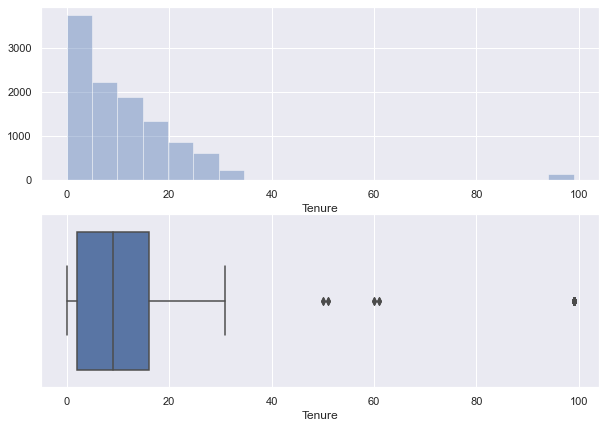

In [21]:
# Tenure

print(df.Tenure.describe())

plt.figure(figsize = (10,7))
plt.subplot(2,1,1)
sns.distplot(df.Tenure, kde = False, bins = 20);
plt.subplot(2,1,2)
sns.boxplot(df.Tenure);

- Right skewed distribution
- A few outliers
- Quite unlikely that tenure is near to 100 years

count    11158.000000
mean        17.867091
std          8.853269
min          4.000000
25%         11.000000
50%         16.000000
75%         23.000000
max        132.000000
Name: CC_Contacted_LY, dtype: float64


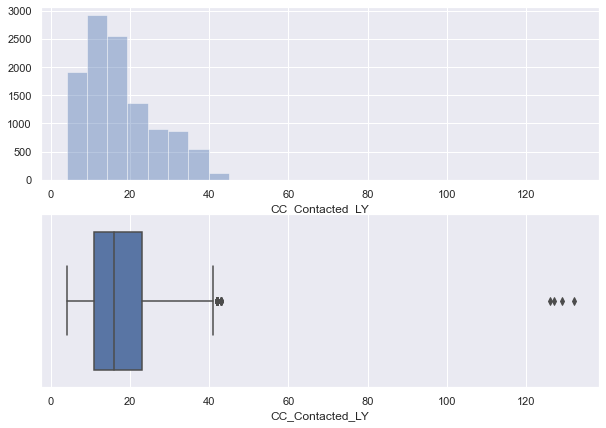

In [22]:
# Customer contacted last 12 months

print(df.CC_Contacted_LY.describe())

plt.figure(figsize = (10,7))
plt.subplot(2,1,1)
sns.distplot(df.CC_Contacted_LY, kde = False, bins = 25);
plt.subplot(2,1,2)
sns.boxplot(df.CC_Contacted_LY);

- Most customers contacted the customer care 10-15 times
- A few customers contacted more than 120 times.
- Probably these are the ones not satisfied with the service

In [23]:
df[df.CC_Contacted_LY>120]

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
1309,21309,No,25.0,Tier 3,126.0,Debit Card,Male,2.0,3.0,Regular Plus,1.0,Married,3.0,0.0,15.0,1.0,0.0,134.82,Computer
4124,24124,No,26.0,Tier 3,127.0,Debit Card,Male,3.0,4.0,Regular Plus,1.0,Married,4.0,0.0,16.0,2.0,1.0,159.82,Computer
6939,26939,No,25.0,Tier 3,132.0,Debit Card,Male,2.0,3.0,Regular Plus,1.0,Married,4.0,0.0,15.0,1.0,0.0,138.82,Computer
9754,29754,No,26.0,Tier 3,129.0,Debit Card,Male,3.0,4.0,Regular Plus,1.0,Married,4.0,0.0,18.0,2.0,1.0,163.82,Computer


- It appears, the customers have not still churned, but the fact is evident
  that the service provided is poor

count    11162.000000
mean         2.902526
std          0.725584
min          0.000000
25%          2.000000
50%          3.000000
75%          3.000000
max          5.000000
Name: Service_Score, dtype: float64


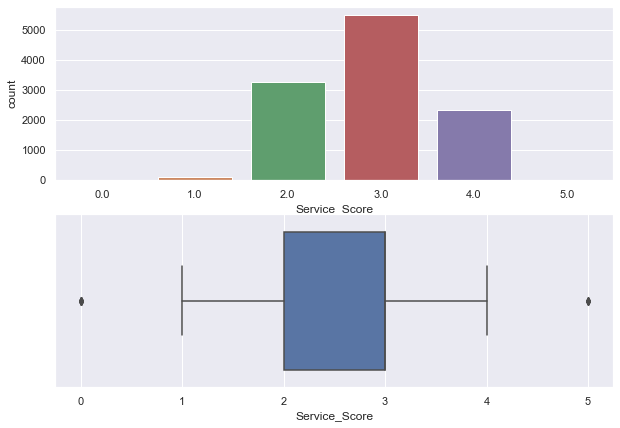

In [24]:
# Service score

print(df.Service_Score.describe())
plt.figure(figsize = (10,7))
plt.subplot(2,1,1)
sns.countplot(df.Service_Score);
plt.subplot(2,1,2)
sns.boxplot(df.Service_Score);

- On a scale of 0-5, 2.9 is the mean and 3 is the median
- Max customers have rated the service as 3

In [25]:
df[df.Service_Score<2]

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
47,20047,No,9.0,Tier 1,9.0,Credit Card,Male,1.0,3.0,Regular Plus,4.0,Single,5.0,0.0,12.0,4.0,2.0,120.88,Computer
49,20049,No,18.0,Tier 3,10.0,NaN,Female,1.0,3.0,Super,5.0,Married,5.0,1.0,11.0,0.0,3.0,150.06,NaN
150,20150,No,10.0,Tier 1,6.0,Credit Card,Female,0.0,3.0,HNI,2.0,Married,3.0,1.0,18.0,0.0,2.0,236.03,Computer
166,20166,No,9.0,Tier 1,9.0,Cash on Delivery,Male,1.0,3.0,Super,4.0,Single,NaN,NaN,12.0,6.0,7.0,144.85,Mobile
212,20212,No,2.0,Tier 1,15.0,UPI,Male,1.0,4.0,Regular Plus,2.0,Single,1.0,0.0,17.0,2.0,2.0,139.83,Mobile
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8439,28439,No,0.0,Tier 3,17.0,UPI,Female,1.0,4.0,Regular Plus,3.0,NaN,2.0,0.0,19.0,1.0,0.0,132.66,Mobile
8595,28595,No,11.0,Tier 1,13.0,Credit Card,Female,1.0,4.0,HNI,2.0,NaN,8.0,1.0,21.0,1.0,3.0,264.03,Computer
9395,29395,No,6.0,Tier 1,19.0,Credit Card,Male,1.0,4.0,HNI,1.0,Single,5.0,0.0,28.0,1.0,1.0,238.44,Mobile
10395,30395,No,12.0,Tier 1,24.0,Debit Card,Male,1.0,5.0,Super,5.0,Married,4.0,0.0,16.0,2.0,3.0,193.88,Computer


- Very few customers who have rated the service less than 2

count    10816.000000
mean         3.692862
std          1.022976
min          1.000000
25%          3.000000
50%          4.000000
75%          4.000000
max          6.000000
Name: Account_user_count, dtype: float64


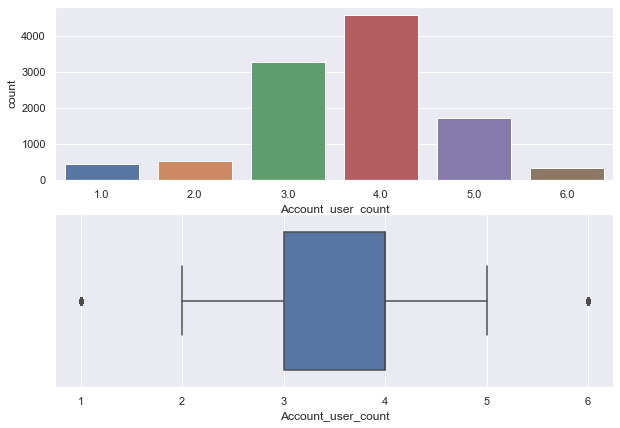

In [26]:
# Account user count

print(df.Account_user_count.describe())
plt.figure(figsize = (10,7))
plt.subplot(2,1,1)
sns.countplot(df.Account_user_count);
plt.subplot(2,1,2)
sns.boxplot(df.Account_user_count);

- Most of the customers have 4 users linked with on account
- Two outliers, with 1 and 6 users linked with 1 account

In [27]:
df[df.Account_user_count==6].shape[0]

315

In [28]:
df[df.Account_user_count<2].shape[0]

446

- 315 customers who have 6 accounts linked
- 446 users with only one account linked

count    11144.000000
mean         3.066493
std          1.379772
min          1.000000
25%          2.000000
50%          3.000000
75%          4.000000
max          5.000000
Name: CC_Agent_Score, dtype: float64


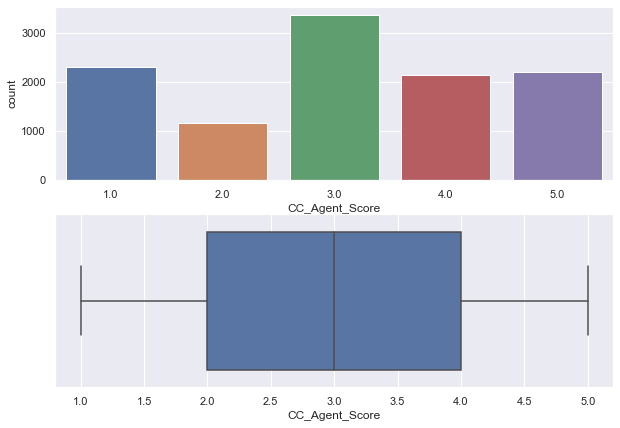

In [29]:
# Customer Care Rating

print(df.CC_Agent_Score.describe())
plt.figure(figsize = (10,7))
plt.subplot(2,1,1)
sns.countplot(df.CC_Agent_Score);
plt.subplot(2,1,2)
sns.boxplot(df.CC_Agent_Score);

- Mean and Median score on the customer care on a scale of 5 are 3.
- Also, the scores given as 1 are quite high in no.

In [30]:
df[df.CC_Agent_Score==1].shape[0]

2302

- A total of 2302 customers are not at all satisfied with the customer care service.

In [31]:
df[df.CC_Agent_Score==5].shape[0]

2191

In [20]:
df[df.CC_Agent_Score==1].groupby('CC_Agent_Score')[['Tenure','CC_Contacted_LY','Service_Score','rev_per_month','Complain_ly','Day_Since_CC_connect']].mean().T

CC_Agent_Score,1.0
Tenure,11.342806
CC_Contacted_LY,17.966681
Service_Score,2.889035
rev_per_month,6.005121
Complain_ly,0.321747
Day_Since_CC_connect,4.582136


- A total of 2191 customers are fully satisfied

count    10469.000000
mean         6.362594
std         11.909686
min          1.000000
25%          3.000000
50%          5.000000
75%          7.000000
max        140.000000
Name: rev_per_month, dtype: float64


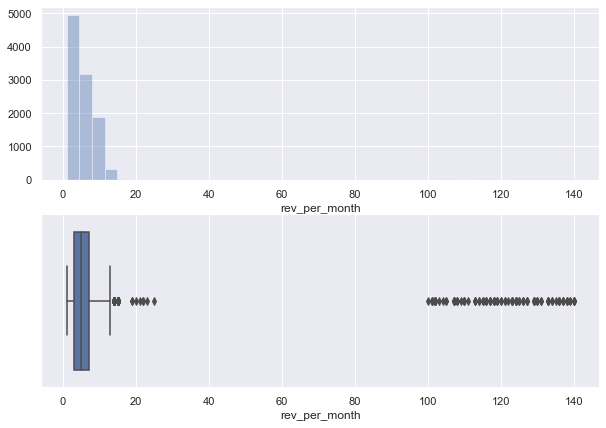

In [32]:
# Revenue per month

print(df.rev_per_month.describe())
plt.figure(figsize = (10,7))
plt.subplot(2,1,1)
sns.distplot(df.rev_per_month, kde = False, bins = 40);
plt.subplot(2,1,2)
sns.boxplot(df.rev_per_month);


- Too many outliers
- However the max frequency of rev lies between 0 and 20
- The 75th percentile and the max aree too far away
- Also the std deviation is very high

In [33]:
df[df.rev_per_month>80].shape[0]

105

- The total customers generating revenue on the higher side are 105.
- Seems they are importrant to the company

In [34]:
df[df.rev_per_month>80].drop(['AccountID','Tenure'],axis = 1).describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Churn,105,2,No,82,NaN,NaN,NaN,NaN,NaN,NaN,NaN
City_Tier,105,3,Tier 1,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CC_Contacted_LY,105,NaN,NaN,NaN,17.6952,9.52237,5,11,15,23,40
Payment,105,5,Debit Card,43,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,105,2,Male,56,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Service_Score,105,NaN,NaN,NaN,2.85714,0.726273,2,2,3,3,4
Account_user_count,105,NaN,NaN,NaN,3.72381,1.06062,1,3,4,4,6
account_segment,105,5,Regular Plus,39,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CC_Agent_Score,105,NaN,NaN,NaN,3.20952,1.37767,1,2,3,4,5
Marital_Status,105,3,Married,49,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<AxesSubplot:xlabel='Complain_ly', ylabel='count'>

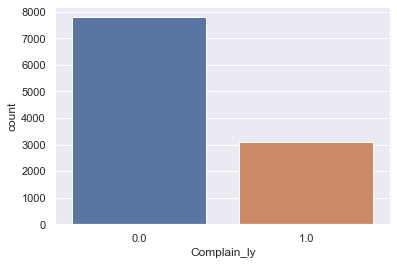

In [35]:
# Complaints raised in the last year

sns.countplot(df.Complain_ly)

- A total of 3000 users have registered complaints in the last year

count    11257.000000
mean        16.193391
std          3.757721
min          4.000000
25%         13.000000
50%         15.000000
75%         19.000000
max         28.000000
Name: rev_growth_yoy, dtype: float64


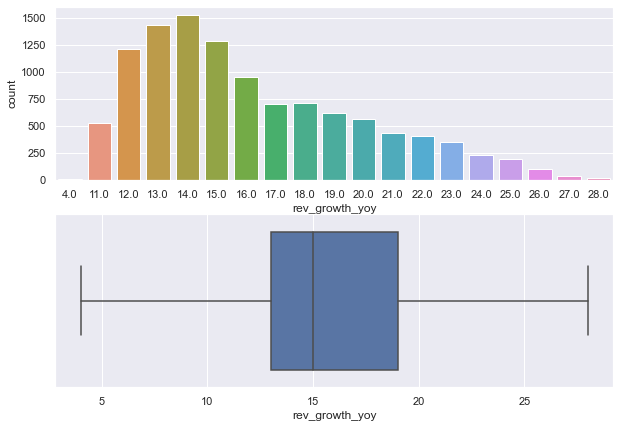

In [36]:
# Revenue growth percentage

print(df.rev_growth_yoy.describe())
plt.figure(figsize = (10,7))
plt.subplot(2,1,1)
sns.countplot(df.rev_growth_yoy);
plt.subplot(2,1,2)
sns.boxplot(df.rev_growth_yoy);

- Max growth is shown in the range of 12 to 16%
- No Outliers

In [37]:
df[(df.rev_growth_yoy>=12) & (df.rev_growth_yoy<=15)].drop(['AccountID'], axis = 1).describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Churn,5444,2,No,4530,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Tenure,5323,NaN,NaN,NaN,10.7242,12.3616,0,2,8,16,99
City_Tier,5393,3,Tier 1,3459,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CC_Contacted_LY,5393,NaN,NaN,NaN,17.397,8.73016,4,11,15,22,132
Payment,5393,5,Debit Card,2207,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,5389,2,Male,3247,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Service_Score,5402,NaN,NaN,NaN,2.89763,0.719294,0,2,3,3,5
Account_user_count,5228,NaN,NaN,NaN,3.70371,0.988362,1,3,4,4,6
account_segment,5396,5,Super,1993,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CC_Agent_Score,5395,NaN,NaN,NaN,3.07989,1.37085,1,2,3,4,5


count    11257.000000
mean         1.790619
std          1.969551
min          0.000000
25%          1.000000
50%          1.000000
75%          2.000000
max         16.000000
Name: coupon_used_for_payment, dtype: float64


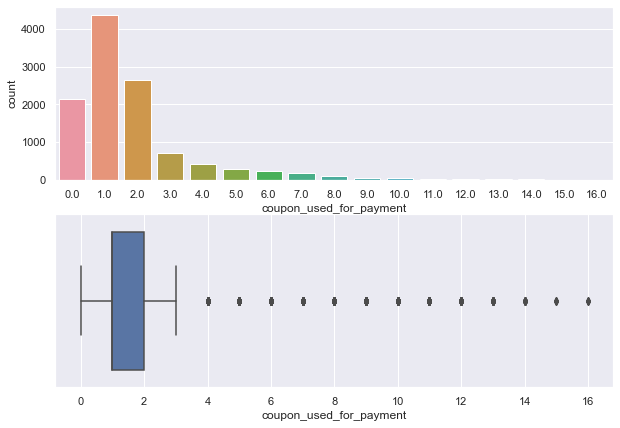

In [38]:
# Coupon used


print(df.coupon_used_for_payment.describe())
plt.figure(figsize = (10,7))
plt.subplot(2,1,1)
sns.countplot(df.coupon_used_for_payment);
plt.subplot(2,1,2)
sns.boxplot(df.coupon_used_for_payment);

- Most of the customers have used the coupons either once twice or none at all.
- However, there are a few outliers, which have used the coupon a lot

In [39]:
df[df.coupon_used_for_payment>3].drop('AccountID',axis = 1).describe().T

,count,mean,std,min,25%,50%,75%,max
Tenure,1361.0,13.692138,12.108092,0.0,6.000,12.00,19.00,99.0
CC_Contacted_LY,1368.0,17.576023,8.883876,5.0,11.000,15.00,22.00,43.0
Service_Score,1368.0,2.984649,0.721028,1.0,2.000,3.00,3.00,5.0
Account_user_count,1340.0,3.817910,0.995723,1.0,3.000,4.00,4.00,6.0
CC_Agent_Score,1368.0,3.147661,1.393939,1.0,2.000,3.00,4.00,5.0
rev_per_month,1300.0,6.649231,13.515368,1.0,3.000,5.00,7.00,140.0
Complain_ly,1337.0,0.292446,0.455056,0.0,0.000,0.00,1.00,1.0
rev_growth_yoy,1380.0,16.172464,4.177615,4.0,13.000,15.00,19.00,28.0
coupon_used_for_payment,1380.0,6.071014,2.349925,4.0,4.000,5.00,7.00,16.0
Day_Since_CC_connect,1330.0,8.154887,3.806463,0.0,7.000,8.00,9.00,47.0


count    10902.000000
mean         4.633187
std          3.697637
min          0.000000
25%          2.000000
50%          3.000000
75%          8.000000
max         47.000000
Name: Day_Since_CC_connect, dtype: float64


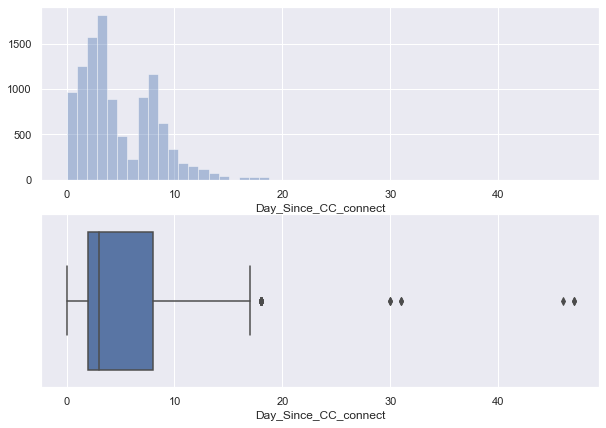

In [6]:
# Days since no customer has contacted the customer care


print(df.Day_Since_CC_connect.describe())
plt.figure(figsize = (10,7))
plt.subplot(2,1,1)
sns.distplot(df.Day_Since_CC_connect, kde = False);
plt.subplot(2,1,2)
sns.boxplot(df.Day_Since_CC_connect);


- There are hardly 4 days when the customer care has not been contacted.
- The more frequently customer care is being contacted represents they are more unsatisfied

In [41]:
df[df.Day_Since_CC_connect<=3].describe()

,AccountID,Tenure,CC_Contacted_LY,Service_Score,Account_user_count,CC_Agent_Score,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback
count,5610.000000,5490.000000,5554.000000,5560.000000,5368.000000,5547.000000,5208.000000,5436.000000,5607.000000,5608.000000,5610.00000,5424.000000
mean,25487.491087,9.978689,17.785560,2.836691,3.676788,3.049576,6.566052,0.298197,16.135367,1.228424,1.75615,184.822126
std,3249.444647,13.482379,9.037525,0.724971,1.012888,1.358241,11.773250,0.457509,3.659574,1.151483,1.08429,183.923676
min,20001.000000,0.000000,4.000000,0.000000,1.000000,1.000000,1.000000,0.000000,11.000000,0.000000,0.00000,0.000000
25%,22550.500000,1.000000,11.000000,2.000000,3.000000,2.000000,3.000000,0.000000,13.000000,1.000000,1.00000,138.200000
50%,25613.500000,7.000000,16.000000,3.000000,4.000000,3.000000,5.000000,0.000000,15.000000,1.000000,2.00000,153.995000
75%,28181.500000,15.000000,23.000000,3.000000,4.000000,4.000000,7.000000,1.000000,19.000000,2.000000,3.00000,179.480000
max,31259.000000,99.000000,132.000000,4.000000,6.000000,5.000000,140.000000,1.000000,28.000000,14.000000,3.00000,1992.000000


count    10787.000000
mean       196.236370
std        178.660514
min          0.000000
25%        147.210000
50%        165.250000
75%        200.010000
max       1997.000000
Name: cashback, dtype: float64


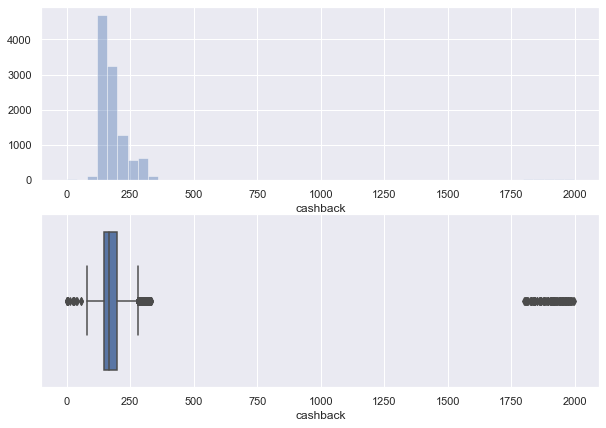

In [42]:
# Cashback

print(df.cashback.describe())
plt.figure(figsize = (10,7))
plt.subplot(2,1,1)
sns.distplot(df.cashback, kde = False);
plt.subplot(2,1,2)
sns.boxplot(df.cashback);

- There are a lot of outliers on both the sides
- Also, there are a few accounts those have recived a very high cashback

In [43]:
df[df.cashback>1750].describe().T

,count,mean,std,min,25%,50%,75%,max
AccountID,108.0,25326.842593,3189.346027,20031.0,22865.50,25115.0,27868.75,31105.0
Tenure,108.0,10.296296,9.982470,0.0,1.75,7.0,17.00,51.0
CC_Contacted_LY,108.0,17.898148,8.672591,6.0,12.00,15.0,23.00,39.0
Service_Score,108.0,2.916667,0.762742,2.0,2.00,3.0,3.25,4.0
Account_user_count,108.0,3.703704,1.121241,1.0,3.00,4.0,4.00,6.0
CC_Agent_Score,108.0,2.879630,1.372068,1.0,1.00,3.0,4.00,5.0
rev_per_month,108.0,5.314815,2.962848,1.0,3.00,5.0,7.00,14.0
Complain_ly,108.0,0.324074,0.470210,0.0,0.00,0.0,1.00,1.0
rev_growth_yoy,108.0,16.009259,3.928081,11.0,13.00,15.0,18.00,26.0
coupon_used_for_payment,108.0,1.722222,1.848633,0.0,1.00,1.0,2.00,11.0


<AxesSubplot:>

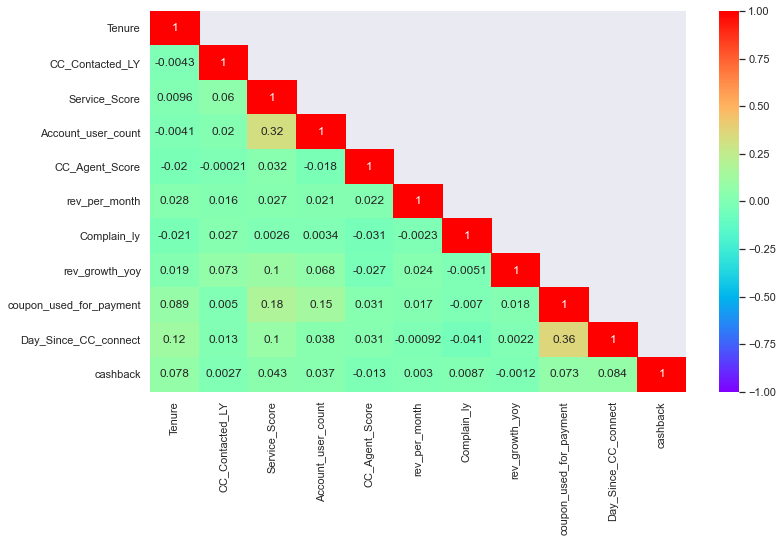

In [54]:
# Bivariate Analysis
mask = np.array(df.drop('AccountID',axis = 1).corr())
mask[np.tril_indices_from(mask)] = False
plt.subplots(figsize=(12,7))
sns.heatmap(df.drop('AccountID',axis = 1).corr(), mask = mask, annot = True, cmap='rainbow', vmin=-1, vmax=1)

- There is hardly any corelation between the variables
* No problem of multicollinearity

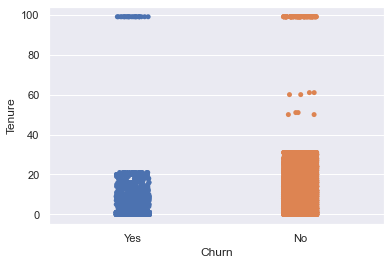

In [64]:
# Churn vs Tenure

sns.stripplot(df.Churn, df.Tenure, jitter = True);

- It appears that those who have tenure<=20, are more prone to churn. However, there are a few outlier as well.

In [84]:
df.groupby('Churn')[['Tenure','Churn']].mean()

,Tenure
Churn,
No,12.371329
Yes,4.327381


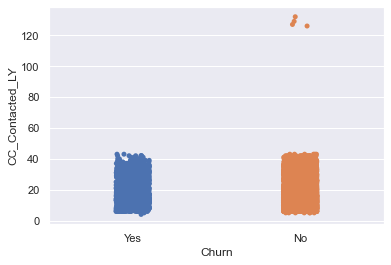

In [70]:
# Churn vs CC_last contacted

sns.stripplot(df.Churn, df.CC_Contacted_LY, jitter = True);

- No clear demarcation.
- A few outliers, which needed to be explore further.
- Either they are anomalies or really satisfied customers, who resolve their problems by contacting cc frequently

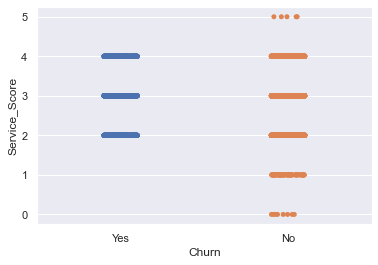

In [71]:
# Churn vs Service score

sns.stripplot(df.Churn, df.Service_Score);

- Its quite surprising that, people who have given rating more than average have churned compared to those with 
too poor ratings

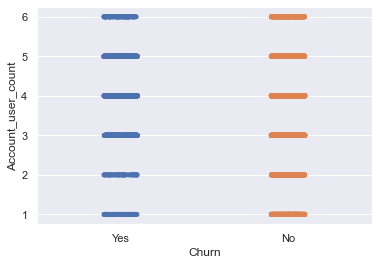

In [80]:
# Churn vs Account users


sns.stripplot(df.Churn, df.Account_user_count);

In [81]:
df.groupby('Churn')['Account_user_count'].mean()

Churn
No     3.643334
Yes    3.936066
Name: Account_user_count, dtype: float64

- No clear demarcation with user account.
- Can't differentate on the basis of no of user accounts

<AxesSubplot:xlabel='Churn', ylabel='CC_Agent_Score'>

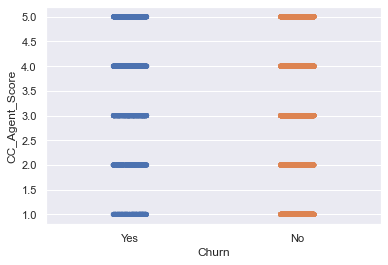

In [85]:
## Churn vs cc agent score

sns.stripplot(df.Churn, df.CC_Agent_Score)

In [89]:
df.groupby('Churn')[['CC_Agent_Score','Churn']].mean()

,CC_Agent_Score
Churn,
No,3.000863
Yes,3.391142


- No clear demarcation
- It is quite surprising to note that 

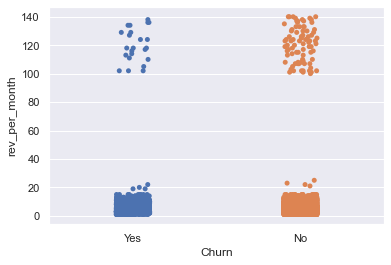

In [90]:
# Churn vs rev/month

sns.stripplot(df.Churn, df.rev_per_month);

In [96]:
df[df.rev_per_month>100].groupby('Churn')['rev_per_month'].count()

Churn
No     81
Yes    23
Name: rev_per_month, dtype: int64

- No clear differentiation
- However, there are very few in the high revenue that churned.

<AxesSubplot:xlabel='Complain_ly', ylabel='count'>

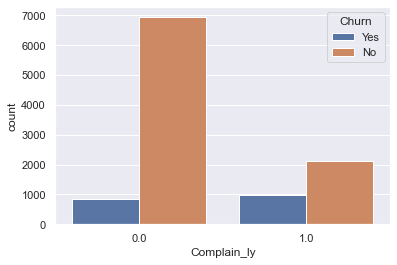

In [99]:
# Churn vs complains

sns.countplot(df.Complain_ly, hue = df.Churn)

- Comparatively, those had complaints, are more likely to churn, however there no. seems to be less

In [103]:
df.groupby('Churn')[['Complain_ly','Churn','CC_Agent_Score','Service_Score']].mean()

,Complain_ly,CC_Agent_Score,Service_Score
Churn,,,
No,0.234197,3.000863,2.899591
Yes,0.537541,3.391142,2.917021


- Its disturbing to note that, those who have churned have rated the service of company and customer care both above average.
- Still they churned

<AxesSubplot:xlabel='Churn', ylabel='rev_growth_yoy'>

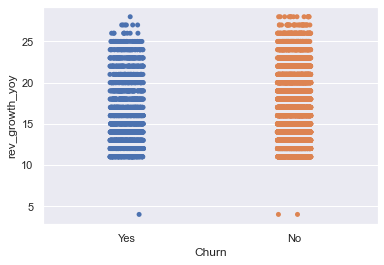

In [104]:
# Churn vs rev growth per year

sns.stripplot(df.Churn, df.rev_growth_yoy)

In [107]:
df[df.rev_growth_yoy>df.rev_growth_yoy.mean()].groupby('Churn')[['rev_growth_yoy']].count()

,rev_growth_yoy
Churn,
No,3629
Yes,709


In [108]:
df[df.rev_growth_yoy>df.rev_growth_yoy.mean()].groupby('Churn')[['rev_growth_yoy']].mean()

,rev_growth_yoy
Churn,
No,20.195646
Yes,20.307475


- Accounts with rev growth above mean are less likely to churn
- However, the avg rev growth of above avg customers remain almost the same

<AxesSubplot:xlabel='Churn', ylabel='coupon_used_for_payment'>

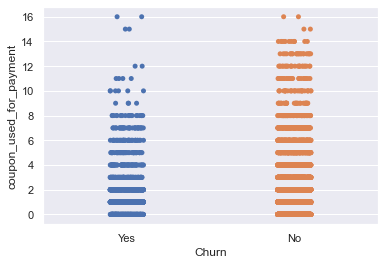

In [110]:
# Churn vs coupon used

sns.stripplot(df.Churn, df.coupon_used_for_payment)

- Customers who have used more than 12 coupons are less in no to be churned.
- A possible strategy could be to offer more coupons to the people who are on the verge of churning

<AxesSubplot:xlabel='Churn', ylabel='Day_Since_CC_connect'>

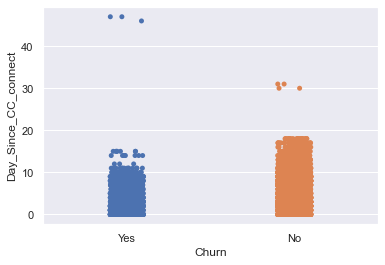

In [111]:
# Churn vs days_since_cc_contacted

sns.stripplot(df.Churn, df.Day_Since_CC_connect)

- There is not a very clear demarcation on the lower side, however, those who have not contacted CC for more than a month are sure to churn

In [113]:
df.groupby('Churn')[['Day_Since_CC_connect']].mean()

,Day_Since_CC_connect
Churn,
No,4.879052
Yes,3.415939


- From the aboce table, an imp fact to note is that those who have contacted CC more recently are more likely to churn
- Might be the reason they are not very happy with the service

In [117]:
df.groupby('Churn')[['Day_Since_CC_connect','CC_Agent_Score','Service_Score']].mean()

,Day_Since_CC_connect,CC_Agent_Score,Service_Score
Churn,,,
No,4.879052,3.000863,2.899591
Yes,3.415939,3.391142,2.917021


- On the contrary it seems, the ones who are churning have rated both the customer care and Service above average

<AxesSubplot:xlabel='Churn', ylabel='cashback'>

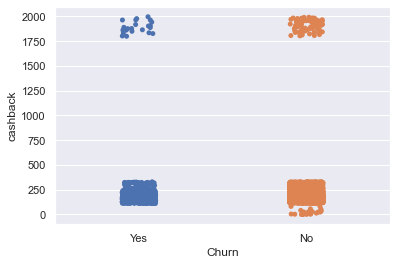

In [118]:
# Churn vs Cashback

sns.stripplot(df.Churn, df.cashback)

In [120]:
df.groupby('Churn')[['cashback']].mean()

,cashback
Churn,
No,198.834930
Yes,183.356924


- Clearly, those who receive less cashback are more likely to churn

In [123]:
l1 = df.select_dtypes('object').columns
l2 = df.select_dtypes(include = ['float','int']).columns

In [124]:
l1

Index(['Churn', 'City_Tier', 'Payment', 'Gender', 'account_segment',
       'Marital_Status', 'Login_device'],
      dtype='object')

In [125]:
l2

Index(['Tenure', 'CC_Contacted_LY', 'Service_Score', 'Account_user_count',
       'CC_Agent_Score', 'rev_per_month', 'Complain_ly', 'rev_growth_yoy',
       'coupon_used_for_payment', 'Day_Since_CC_connect', 'cashback'],
      dtype='object')

In [ ]:
# Exploring City Tier

<AxesSubplot:xlabel='City_Tier', ylabel='Tenure'>

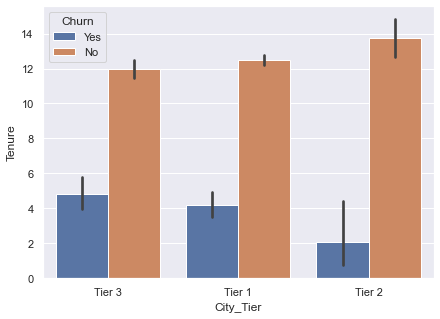

In [150]:
# Tenure

plt.figure(figsize = (7,5))
sns.barplot(x = df.City_Tier, y = df.Tenure, hue = df.Churn)

In [138]:
df[df.Churn=='Yes'].groupby('City_Tier')[['City_Tier','Tenure']].mean()

,Tenure
City_Tier,
Tier 1,4.192383
Tier 2,2.063830
Tier 3,4.838710


In [137]:
pd.crosstab(df.City_Tier,df.Churn)

Churn,No,Yes
City_Tier,,
Tier 1,6207,1056
Tier 2,384,96
Tier 3,2678,727


- Max customers churn from City Tier 1
- Avg tenure for customers who churn is highest for Tier 3 followed by 1 and 2

<AxesSubplot:xlabel='City_Tier', ylabel='CC_Contacted_LY'>

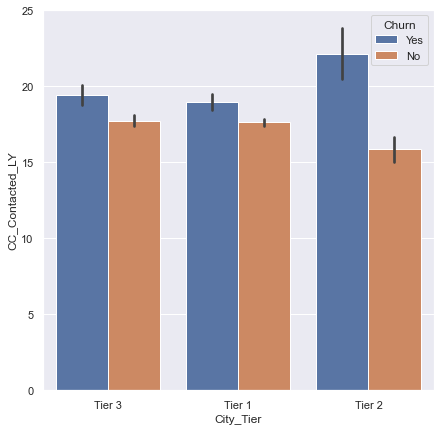

In [191]:
# CC_Contacted

plt.figure(figsize = (7,7))
sns.barplot(df.City_Tier,df.CC_Contacted_LY, hue = df.Churn)

In [163]:
df.groupby('Churn')[['CC_Contacted_LY']].mean()

,CC_Contacted_LY
Churn,
No,17.580065
Yes,19.285410


In [192]:
df[df.Churn =='Yes'].groupby('City_Tier')[['CC_Contacted_LY']].mean()

,CC_Contacted_LY
City_Tier,
Tier 1,18.941515
Tier 2,22.135417
Tier 3,19.419668


In [193]:
df[df.Churn =='No'].groupby('City_Tier')[['CC_Contacted_LY']].mean()

,CC_Contacted_LY
City_Tier,
Tier 1,17.633512
Tier 2,15.848168
Tier 3,17.717736


- It is evident that the ones who chruned contacted the customer care more
- Customers from Tier 2 churned more and also contacted the customer care more on an average.

<AxesSubplot:xlabel='City_Tier', ylabel='Service_Score'>

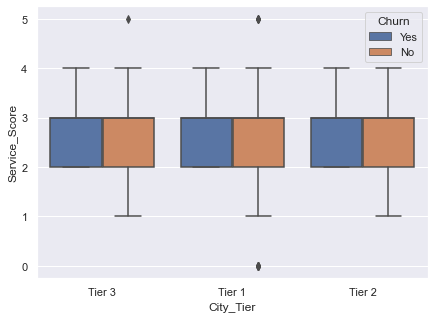

In [175]:
# Servvice Score

plt.figure(figsize = (7,5))
sns.boxplot(df.City_Tier, df.Service_Score, hue = df.Churn)

- It seems all the three cities have rated the Service equally
- Both those chruned and those not have provided same service scores

In [187]:
df[df.Churn=='Yes'].groupby('City_Tier')[['Service_Score']].mean()

,Service_Score
City_Tier,
Tier 1,2.951289
Tier 2,2.842105
Tier 3,2.877947


In [188]:
df[df.Churn=='No'].groupby('City_Tier')[['Service_Score']].mean()

,Service_Score
City_Tier,
Tier 1,2.900146
Tier 2,2.808399
Tier 3,2.906662


In [ ]:
# Account User count

sns.stripplot(df.City_Tier)

City_Tier
Tier 1    11.304153
Tier 2    11.385928
Tier 3    10.432043
Name: Tenure, dtype: float64


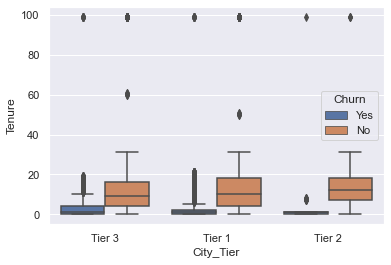

City_Tier
Tier 1    17.823096
Tier 2    17.110879
Tier 3    18.082147
Name: CC_Contacted_LY, dtype: float64


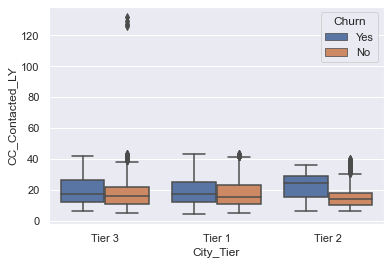

City_Tier
Tier 1    2.907588
Tier 2    2.815126
Tier 3    2.900533
Name: Service_Score, dtype: float64


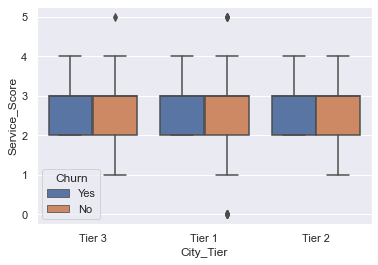

City_Tier
Tier 1    3.675338
Tier 2    3.665944
Tier 3    3.733638
Name: Account_user_count, dtype: float64


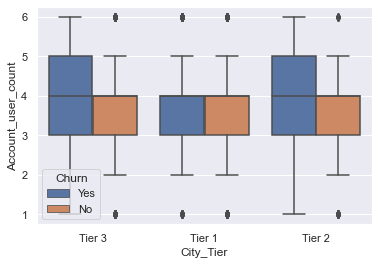

City_Tier
Tier 1    3.070883
Tier 2    3.223158
Tier 3    3.030042
Name: CC_Agent_Score, dtype: float64


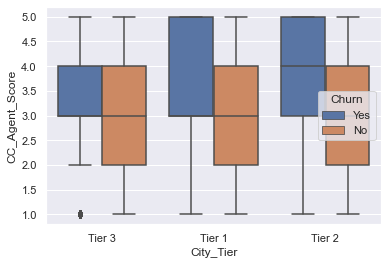

City_Tier
Tier 1    6.620587
Tier 2    6.301370
Tier 3    5.873466
Name: rev_per_month, dtype: float64


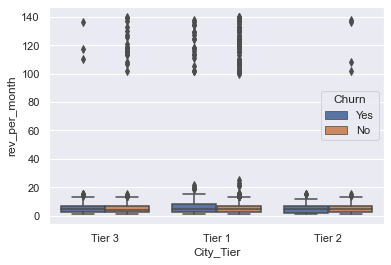

City_Tier
Tier 1    0.285735
Tier 2    0.251641
Tier 3    0.289434
Name: Complain_ly, dtype: float64


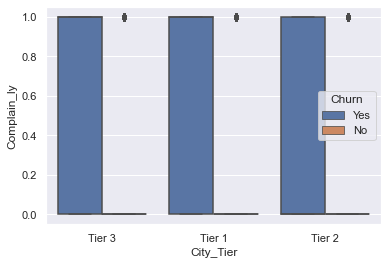

City_Tier
Tier 1    16.292935
Tier 2    15.566667
Tier 3    16.068155
Name: rev_growth_yoy, dtype: float64


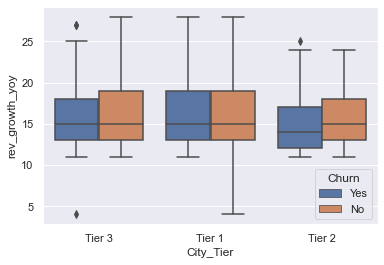

City_Tier
Tier 1    1.767387
Tier 2    1.583333
Tier 3    1.866627
Name: coupon_used_for_payment, dtype: float64


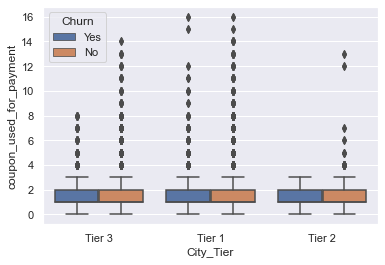

City_Tier
Tier 1    4.588411
Tier 2    4.114471
Tier 3    4.796409
Name: Day_Since_CC_connect, dtype: float64


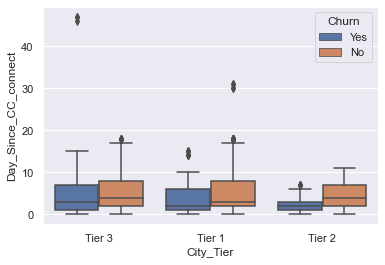

City_Tier
Tier 1    195.244865
Tier 2    190.559161
Tier 3    199.605101
Name: cashback, dtype: float64


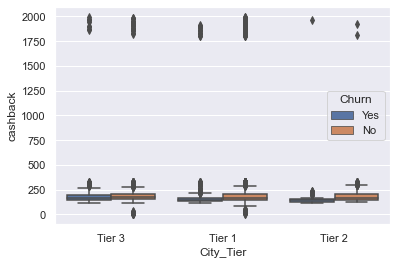

In [199]:
for i in l2:
    sns.boxplot(df.City_Tier, df[i], hue = df.Churn);
    print(df.groupby('City_Tier')[i].mean())
    plt.show()

In [7]:
# Getting pandas profiling
!pip install pandas-profiling

In [9]:
import pandas_profiling

In [10]:
pandas_profiling.ProfileReport(df)

In [22]:
df.Churn.value_counts(normalize = True)

0    0.831616
1    0.168384
Name: Churn, dtype: float64